# 1.1 Data Uploading, Cleaning and Storing

In [1]:
#Importing All major The Necessary Packages
import numpy as np
import pandas as pd
from pandas import DataFrame,Series
from sklearn.decomposition import PCA
import  matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MaxAbsScaler 

In [207]:
xls_file=pd.ExcelFile('C:\Users\Amardeep\Downloads\RFAQ.xlsx')
DT=xls_file.parse('Sheet1')
#Removing unnecessary columns and empty rows
DT=DT.drop(columns=['hour','month','day','D','Day of Year'])
NT=DT.dropna(axis = 0, how ='any') 
NT

,pm2.5,DEWP,TEMP,PRES,Station Pressure,Iws,Is,Ir,Relative Humidity(%),Cloud Base(ft),...,Hour Angle,Zenith Angle,Declination Angle,Solar Insolation,Dayofweek,Month,WindChill,Mixed Layer Height,Mixed Layer Temperature,LCL
0,129,-16,-4.0,1020.0,985.731782,1.79,0,0,38.784785,4909.090909,...,180,1.315677,-22.705329,252.361206,Tuesday,Jan,1099.576212,21.924598,19.020828,1500.0
1,148,-15,-4.0,1020.0,985.732185,2.68,0,0,42.130158,4500.000000,...,165,1.054404,-22.705329,493.745734,Tuesday,Jan,1324.385944,30.667052,28.200404,1375.0
2,159,-11,-5.0,1021.0,986.698589,3.57,0,0,62.793843,2454.545455,...,150,0.571601,-22.705329,841.035723,Tuesday,Jan,1548.808786,40.024652,37.025885,750.0
3,181,-7,-5.0,1022.0,987.664993,5.36,1,0,85.857955,818.181818,...,135,1.498747,-22.705329,71.987181,Tuesday,Jan,1854.252454,11.709758,7.295246,250.0
4,138,-7,-5.0,1022.0,987.664993,6.25,2,0,85.857955,818.181818,...,120,0.466449,-22.705329,893.170956,Tuesday,Jan,1981.880500,41.246552,38.308879,250.0
5,109,-7,-6.0,1022.0,987.664993,7.14,3,0,92.629771,409.090909,...,105,1.143367,-22.705329,414.532722,Tuesday,Jan,2153.199162,28.099575,23.504554,125.0
6,105,-7,-6.0,1023.0,988.631397,8.93,4,0,92.629771,409.090909,...,90,1.244454,-22.705329,320.580309,Tuesday,Jan,2365.191129,24.710912,19.946457,125.0
7,124,-7,-5.0,1024.0,989.597801,10.72,0,0,85.857955,818.181818,...,75,0.342352,-22.705329,941.967568,Tuesday,Jan,2483.643421,42.358281,39.476195,250.0
8,132,-7,-5.0,1025.0,990.564206,14.30,0,0,85.857955,818.181818,...,45,0.704188,-22.705329,762.137207,Tuesday,Jan,2783.795378,38.101049,35.006101,250.0
9,140,-7,-5.0,1026.0,991.530610,17.43,1,0,85.857955,818.181818,...,30,0.935010,-22.705329,593.810213,Tuesday,Jan,3000.858860,33.631341,30.312908,250.0


In [ ]:
#Converting hour column to cyclical data. Note that this was already done in the file previously and has been added for reference purposes.
NT['hour_sin'] = np.sin(2 * np.pi * AQ['hour']/23.0)
NT['hour_cos'] = np.cos(2 * np.pi * AQ['hour']/23.0)
NT=AQ.drop(columns='hour')

In [3]:
one_hot=pd.get_dummies(NT['cbwd'])
# Drop column as it is now encoded
NT = NT.drop('cbwd',axis = 1)
# Join the encoded df
NT = NT.join(one_hot)

In [4]:
two_hot=pd.get_dummies(NT['AQI'])
# Drop column as it is now encoded
NT = NT.drop('AQI',axis = 1)
# Join the encoded df
NT = NT.join(two_hot)

In [5]:
th_hot=pd.get_dummies(NT['Day or Night'])
# Drop column as it is now encoded
NT = NT.drop('Day or Night',axis = 1)
# Join the encoded df
NT = NT.join(th_hot)

In [6]:
fv_hot=pd.get_dummies(NT['Lapse Rate'])
# Drop column as it is now encoded
NT = NT.drop('Lapse Rate',axis = 1)
# Join the encoded df
NT = NT.join(fv_hot)

In [188]:
s_hot=pd.get_dummies(NT['Dayofweek'])
# Drop column as it is now encoded
NT = NT.drop('Dayofweek',axis = 1)
# Join the encoded df
NT = NT.join(s_hot)

In [189]:
svn_hot=pd.get_dummies(NT['Month'])
# Drop column as it is now encoded
NT = NT.drop('Month',axis = 1)
# Join the encoded df
NT = NT.join(svn_hot)
NT

,pm2.5,DEWP,TEMP,PRES,Station Pressure,Iws,Is,Ir,Relative Humidity(%),Cloud Base(ft),...,Dec,Feb,Jan,Jul,Jun,Mar,May,Nov,Oct,Sep
0,129,-16,-4.0,1020.0,985.731782,1.79,0,0,38.784785,4909.090909,...,0,0,1,0,0,0,0,0,0,0
1,148,-15,-4.0,1020.0,985.732185,2.68,0,0,42.130158,4500.000000,...,0,0,1,0,0,0,0,0,0,0
2,159,-11,-5.0,1021.0,986.698589,3.57,0,0,62.793843,2454.545455,...,0,0,1,0,0,0,0,0,0,0
3,181,-7,-5.0,1022.0,987.664993,5.36,1,0,85.857955,818.181818,...,0,0,1,0,0,0,0,0,0,0
4,138,-7,-5.0,1022.0,987.664993,6.25,2,0,85.857955,818.181818,...,0,0,1,0,0,0,0,0,0,0
5,109,-7,-6.0,1022.0,987.664993,7.14,3,0,92.629771,409.090909,...,0,0,1,0,0,0,0,0,0,0
6,105,-7,-6.0,1023.0,988.631397,8.93,4,0,92.629771,409.090909,...,0,0,1,0,0,0,0,0,0,0
7,124,-7,-5.0,1024.0,989.597801,10.72,0,0,85.857955,818.181818,...,0,0,1,0,0,0,0,0,0,0
8,132,-7,-5.0,1025.0,990.564206,14.30,0,0,85.857955,818.181818,...,0,0,1,0,0,0,0,0,0,0
9,140,-7,-5.0,1026.0,991.530610,17.43,1,0,85.857955,818.181818,...,0,0,1,0,0,0,0,0,0,0


## 1.2.Saving and Uploading Dataset with Features

In [190]:
NT.to_excel('C:\Users\Amardeep\Downloads\RFAQ1.xlsx',sheet_name='Sheet1')

In [ ]:
#Description of the Parameters-Inputs and Outputs
#pm2.5----> Particulate Matter 2.5 concentration.
#Stable----> Atmospheric turbulence is present.
#Unstable----->Atmoshpheric turbulence is not present.
#DEWP	 Dew Point observed
#TEMP	Actual Temperature observed
#PRES	Pressure observed
#Station Pressure	 Pressure adjusted for sea level.
#Iws	Cummulative wind spped
#Is	---->Cummulative snowfall
#Ir	----->Cummulative rainfall
#Relative Humidity(%)	Humidity calculated from temperature and pressure.
#Cloud Base(ft)	----->Height at which clouds are formed.
#Air Density(kg/m3)	------>Air density observed.
#CloudTemp	 Temperature of clouds formed. 
#Heat Index--->Index of heat for hot days.
#NE	----->Wind Direction
#NW	----->Wind Direction
#SE	----->Wind Direction
#cv	----->Wind Direction
#Day	 Daytime for 1, night for 0
#Night	 Night for 1, Day for 0
#Negative	Negative Lapse Rate
#Positive	Positive Lapse Rate
#Autumn	----->Season
#Spring	----->Season
#Summer	------>Season
#Winter	------>Season
#Weekday	1 if Weekday, 0 if not
#Weekend	1 if Weekend, 0 if not
#hour_sin	sine component of hour observation was taken.
#hour_cos	cos component of hour observation was taken.
#Quality	Quality of air dependent on pm2.5(1 if less than 50,0 for greater than 50)
#Hour Angle	----->Solar day angle.
#Zenith Angle	Solar zenith angle.
#Day of Year	Day of the year cummulative.
#Declination Angle	Angle of sun declining on the region.
#Solar Insolation	Amount of solar intensity.
#WindChill	Feeling of coldness as observed by people.
#Mixed Layer Height	--->Height at which particle clouds are formed.
#Mixed Layer Temperature	Temperature of the mixed layer.
#LCL---->Lifting Condensation level



In [2]:
#Uploading dataset with all features from preprocessing. Some of the columns with formulas have been done directly in Excel.
xls_file1=pd.ExcelFile('C:\Users\Amardeep\Downloads\RFAQ1.xlsx')
RF=xls_file1.parse('Sheet1')
RF=RF.drop(columns='Day of Year')
RF

,pm2.5,DEWP,TEMP,PRES,Station Pressure,Iws,Is,Ir,Relative Humidity(%),Cloud Base(ft),...,hour_cos,Quality,Hour Angle,Zenith Angle,Declination Angle,Solar Insolation,WindChill,Mixed Layer Height,Mixed Layer Temperature,LCL
0,129,-16,-4.0,1020.0,985.731782,1.79,0,0,38.784785,4909.090909,...,1.000000,0,180,1.315677,-22.705329,252.361206,1099.576212,21.924598,19.020828,1500.0
1,148,-15,-4.0,1020.0,985.732185,2.68,0,0,42.130158,4500.000000,...,0.962917,0,165,1.054404,-22.705329,493.745734,1324.385944,30.667052,28.200404,1375.0
2,159,-11,-5.0,1021.0,986.698589,3.57,0,0,62.793843,2454.545455,...,0.854419,0,150,0.571601,-22.705329,841.035723,1548.808786,40.024652,37.025885,750.0
3,181,-7,-5.0,1022.0,987.664993,5.36,1,0,85.857955,818.181818,...,0.682553,0,135,1.498747,-22.705329,71.987181,1854.252454,11.709758,7.295246,250.0
4,138,-7,-5.0,1022.0,987.664993,6.25,2,0,85.857955,818.181818,...,0.460065,0,120,0.466449,-22.705329,893.170956,1981.880500,41.246552,38.308879,250.0
5,109,-7,-6.0,1022.0,987.664993,7.14,3,0,92.629771,409.090909,...,0.203456,0,105,1.143367,-22.705329,414.532722,2153.199162,28.099575,23.504554,125.0
6,105,-7,-6.0,1023.0,988.631397,8.93,4,0,92.629771,409.090909,...,-0.068242,0,90,1.244454,-22.705329,320.580309,2365.191129,24.710912,19.946457,125.0
7,124,-7,-5.0,1024.0,989.597801,10.72,0,0,85.857955,818.181818,...,-0.334880,0,75,0.342352,-22.705329,941.967568,2483.643421,42.358281,39.476195,250.0
8,132,-7,-5.0,1025.0,990.564206,14.30,0,0,85.857955,818.181818,...,-0.775711,0,45,0.704188,-22.705329,762.137207,2783.795378,38.101049,35.006101,250.0
9,140,-7,-5.0,1026.0,991.530610,17.43,1,0,85.857955,818.181818,...,-0.917211,0,30,0.935010,-22.705329,593.810213,3000.858860,33.631341,30.312908,250.0


In [14]:
RF.describe

<bound method DataFrame.describe of        pm2.5  DEWP  TEMP    PRES  Station Pressure     Iws  Is  Ir  \
0        129   -16  -4.0  1020.0        985.731782    1.79   0   0   
1        148   -15  -4.0  1020.0        985.732185    2.68   0   0   
2        159   -11  -5.0  1021.0        986.698589    3.57   0   0   
3        181    -7  -5.0  1022.0        987.664993    5.36   1   0   
4        138    -7  -5.0  1022.0        987.664993    6.25   2   0   
5        109    -7  -6.0  1022.0        987.664993    7.14   3   0   
6        105    -7  -6.0  1023.0        988.631397    8.93   4   0   
7        124    -7  -5.0  1024.0        989.597801   10.72   0   0   
8        132    -7  -5.0  1025.0        990.564206   14.30   0   0   
9        140    -7  -5.0  1026.0        991.530610   17.43   1   0   
10       152    -8  -5.0  1026.0        991.530610   20.56   0   0   
11       148    -8  -5.0  1026.0        991.530610   23.69   0   0   
12       164    -8  -5.0  1025.0        990.564206   2

In [15]:
RF.head()

,pm2.5,DEWP,TEMP,PRES,Station Pressure,Iws,Is,Ir,Relative Humidity(%),Cloud Base(ft),...,hour_cos,Quality,Hour Angle,Zenith Angle,Declination Angle,Solar Insolation,WindChill,Mixed Layer Height,Mixed Layer Temperature,LCL
0,129,-16,-4.0,1020.0,985.731782,1.79,0,0,38.784785,4909.090909,...,1.000000,0,180,1.315677,-22.705329,252.361206,1099.576212,21.924598,19.020828,1500.0
1,148,-15,-4.0,1020.0,985.732185,2.68,0,0,42.130158,4500.000000,...,0.962917,0,165,1.054404,-22.705329,493.745734,1324.385944,30.667052,28.200404,1375.0
2,159,-11,-5.0,1021.0,986.698589,3.57,0,0,62.793843,2454.545455,...,0.854419,0,150,0.571601,-22.705329,841.035723,1548.808786,40.024652,37.025885,750.0
3,181,-7,-5.0,1022.0,987.664993,5.36,1,0,85.857955,818.181818,...,0.682553,0,135,1.498747,-22.705329,71.987181,1854.252454,11.709758,7.295246,250.0
4,138,-7,-5.0,1022.0,987.664993,6.25,2,0,85.857955,818.181818,...,0.460065,0,120,0.466449,-22.705329,893.170956,1981.880500,41.246552,38.308879,250.0


In [3]:
Columns=RF.columns

# 2.1 Preliminary Analysis of Data 

### 2.1.1 Data Binning and PCA 

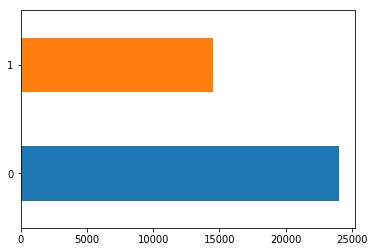

In [4]:
#Checking the distribution of quality of output data.
RF['Quality'].value_counts().plot(kind='barh')

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x00000000F8C49668>]],
      dtype=object)

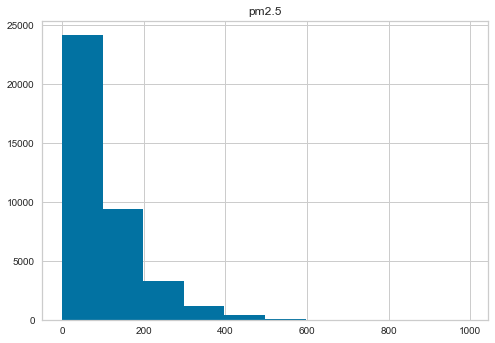

In [140]:
#Distribution plot for pm2.5
RF.hist(column='pm2.5')

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x00000000F8C49160>]],
      dtype=object)

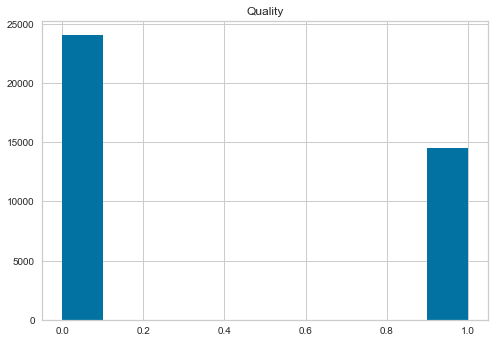

In [141]:
#Distribution plot for Quality
RF.hist(column='Quality')

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x00000000F7354908>]],
      dtype=object)

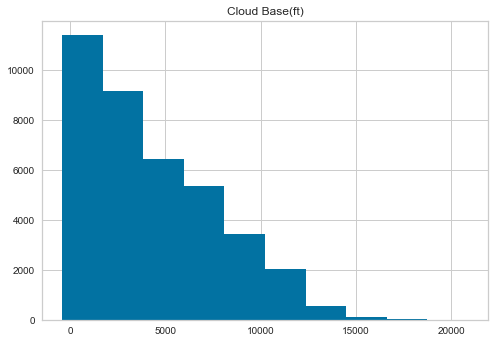

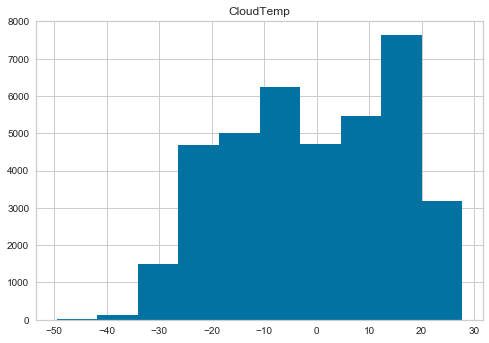

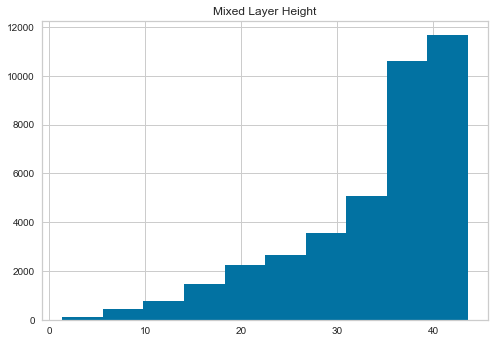

In [154]:
#Distribution plot for Cloud Height and Cloud Temperature
RF.hist(column='Cloud Base(ft)')
RF.hist(column='CloudTemp')
RF.hist(column='Mixed Layer Height')

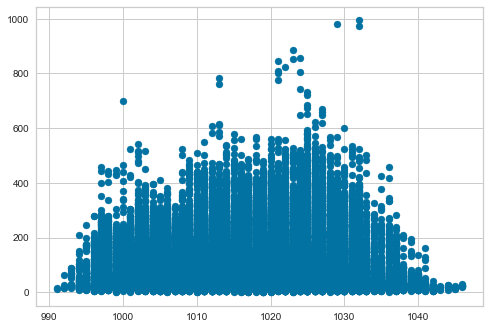

In [169]:
#Scatter plots between pm2.5 and pressure.
plt.scatter(x=RF['PRES'],y=RF['pm2.5'])

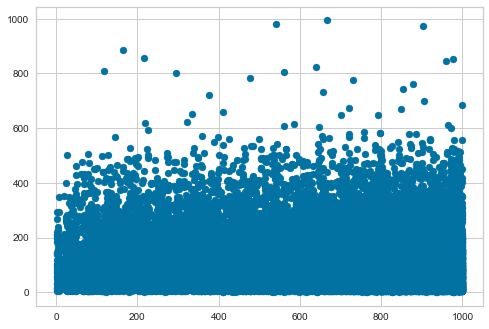

In [170]:
#Scatter plots between pm2.5 and Solar Insolation.
plt.scatter(x=RF['Solar Insolation'],y=RF['pm2.5'])

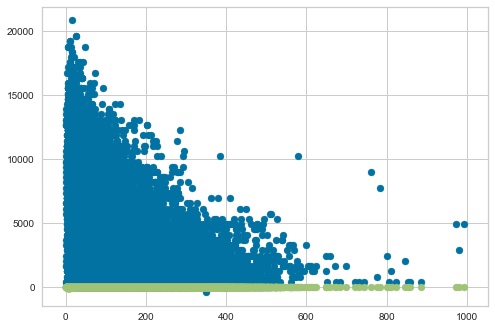

In [162]:
#Scatter plots between pm2.5 and some parameters
plt.scatter(x=RF['pm2.5'],y=RF['Cloud Base(ft)'])
plt.scatter(x=RF['pm2.5'],y=RF['CloudTemp'])

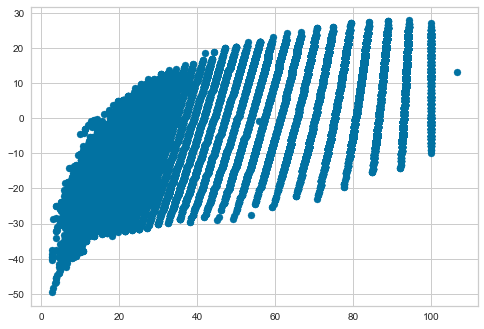

In [164]:
#Scatter plots between Humidity and Cloud Temp
plt.scatter(x=RF['Relative Humidity(%)'],y=RF['CloudTemp'])

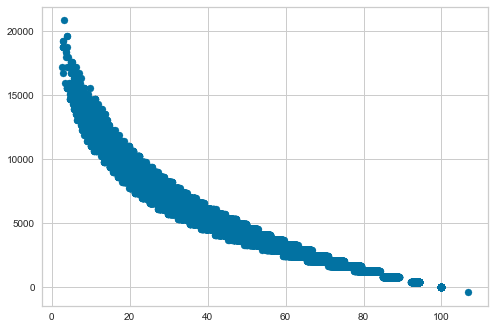

In [167]:
#Scatter plots between Humidity and Cloud Height. The shape of the graph shows the relationship between the two variables.
plt.scatter(x=RF['Relative Humidity(%)'],y=RF['Cloud Base(ft)'])

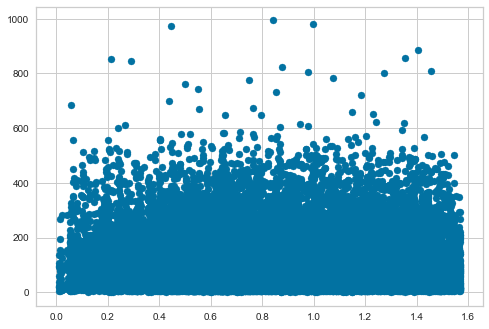

In [172]:
#Scatter plots between Humidity and Cloud Height. The shape of the graph shows the relationship between the two variables.
plt.scatter(x=RF['Zenith Angle'],y=RF['pm2.5'])

### 2.1.2 Data Binning and PCA 

In [87]:
#Data Binning Steps
A1=RF.loc[(RF['pm2.5'] >= 0) & (RF['pm2.5'] <= 50)]
A1

,pm2.5,DEWP,TEMP,PRES,Station Pressure,Iws,Is,Ir,Relative Humidity(%),Cloud Base(ft),...,hour_cos,Quality,Hour Angle,Zenith Angle,Declination Angle,Solar Insolation,WindChill,Mixed Layer Height,Mixed Layer Temperature,LCL
48,25,-17,-10.0,1024.0,989.597801,29.95,0,0,56.596004,2863.636364,...,0.854419,1,150,0.446017,-23.126953,902.172516,4096.308701,41.453876,33.526570,875.0
49,26,-18,-11.0,1024.0,989.597801,39.78,0,0,56.314095,2863.636364,...,0.682553,1,135,1.077779,-23.126953,473.286062,4561.566901,30.024944,20.526191,875.0
50,28,-19,-11.0,1025.0,990.564206,48.72,0,0,51.727185,3272.727273,...,0.460065,1,120,0.372975,-23.126953,931.247528,4808.029027,42.116562,33.222390,1000.0
51,26,-20,-12.0,1026.0,991.530610,55.87,0,0,51.426936,3272.727273,...,0.203456,1,105,0.844215,-23.126953,664.318402,5072.411619,35.572017,25.350618,1000.0
52,20,-21,-12.0,1027.0,992.497014,64.81,0,0,47.165689,3681.818182,...,-0.068242,1,90,0.912307,-23.126953,611.922597,5220.740675,34.140399,23.847419,1125.0
53,29,-21,-13.0,1027.0,992.497014,73.75,0,0,51.124469,3272.727273,...,-0.334880,1,75,0.289241,-23.126953,958.460642,5446.262016,42.727501,31.863876,1000.0
54,26,-22,-13.0,1028.0,993.463418,80.90,0,0,46.851603,3681.818182,...,-0.576680,1,60,1.065194,-23.126953,484.334919,5508.616753,30.373388,18.892057,1125.0
55,27,-22,-13.0,1029.0,994.429822,90.73,0,0,46.851603,3681.818182,...,-0.775711,1,45,0.539098,-23.126953,858.172036,5563.402717,40.430352,29.451870,1125.0
56,25,-23,-12.0,1031.0,996.362630,108.61,0,0,39.579742,4500.000000,...,-0.990686,1,15,1.008547,-23.126953,533.090470,5466.063728,31.865505,21.458780,1375.0
57,29,-21,-11.0,1030.0,995.396226,117.55,0,0,43.543692,4090.909091,...,-0.990686,1,0,0.208918,-23.126953,978.255991,5327.109759,43.166477,34.324801,1250.0


In [88]:
#Creating bins for different sets
bin_names1=['A','B','C','D','E','F','G','H','I','J','K','L','M','N','O']
A1['Level']=pd.qcut(A1['pm2.5'],15,labels=bin_names1)

C:\Users\Amardeep\Anaconda2\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


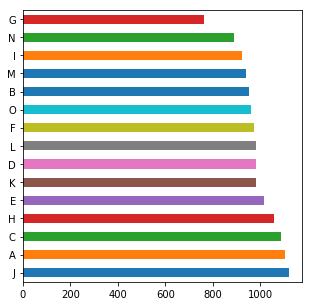

In [89]:
#Plotting number of datapoints in each bin.
A1['Level'].value_counts().plot(kind='barh')

In [90]:
E=A1.loc[A1['Level']=='G']
E.set_index('pm2.5', inplace=True)

In [91]:
E=E.drop(columns='Level')

In [92]:
#Scaling the bin and obtaining the scores for the pca analysis.
E_index=E.index
E= StandardScaler().fit_transform(E)
pca = PCA(n_components=3, svd_solver='full')
PC_scores = pca.fit_transform(E)
scores_pd = pd.DataFrame(data = PC_scores
                         ,columns = ['PC1', 'PC2', 'PC3']
                         ,index =E_index)

C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\preprocessing\data.py:625: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\base.py:462: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


In [93]:
#Dropping unnecessary columns from the dataset.
A2=A1.drop(columns=['pm2.5','Level'])
loadings_pd = pd.DataFrame(data = pca.components_.T
                           ,columns = ['PC1', 'PC2', 'PC3']
                           ,index = A2.columns)

In [94]:
#PLotting the PCA plot fucntion
def myplot(scores,loadings,loading_labels=None,score_labels=None):
    # adjusting the scores to fit in (-1,1)
    xt = scores[:,0]
    yt = scores[:,1]
    n = loadings.shape[0]
    scalext = 1.0/(xt.max() - xt.min())
    scaleyt = 1.0/(yt.max() - yt.min())
    xt_scaled = xt * scalext
    yt_scaled = yt * scaleyt
    # adjusting the loadings to fit in (-1,1)
    p = loadings
    p_scaled = MaxAbsScaler().fit_transform(p)
    
    #plt.scatter(xs * scalex,ys * scaley, s=10)
    for (x,y), label in zip(np.vstack((xt_scaled, yt_scaled)).T,score_labels):
        plt.text(x, y, label, ha='center', size=11)
    
    for i in range(n):
        plt.arrow(0, 0, p_scaled[i,0], p_scaled[i,1], color = 'r',alpha = 0.5)
        if loading_labels is None:
            plt.text(p_scaled[i,0], p_scaled[i,1], "Var"+str(i+1), color = 'g', ha = 'center', va = 'center')
        else:
            plt.text(p_scaled[i,0], p_scaled[i,1], loading_labels[i], color = 'r', ha = 'center', va = 'center', size=16)
    plt.xlim(-1,1)
    plt.ylim(-1,1)
    plt.xlabel("PC{}".format(1), fontsize=20);
    plt.ylabel("PC{}".format(2), fontsize=20);
    plt.tick_params(labelsize=16)
    plt.grid()

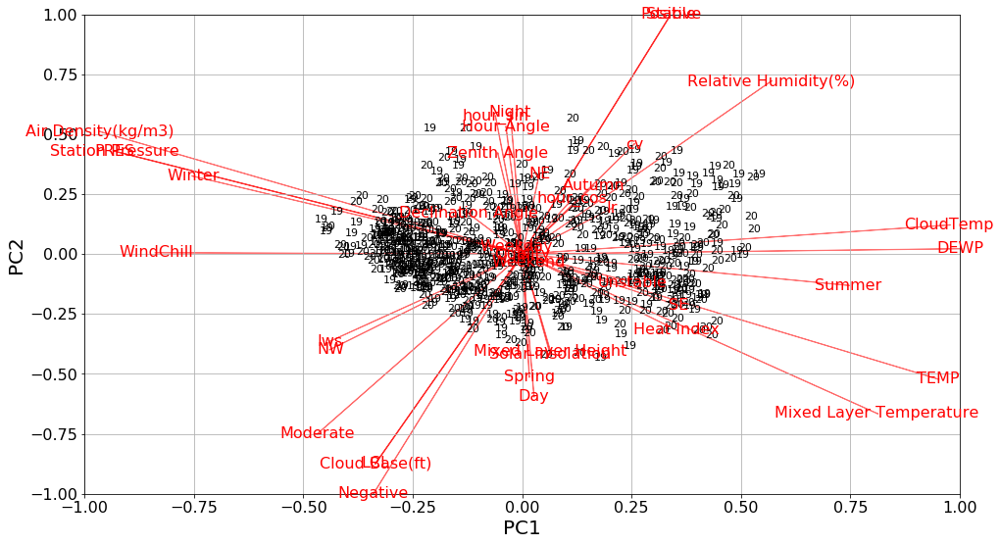

In [95]:
plt.rcParams["figure.figsize"] = [16,9]
myplot(PC_scores[:,:2],loadings_pd.iloc[:,:2],loading_labels=loadings_pd.index,score_labels=scores_pd.index)
plt.show()

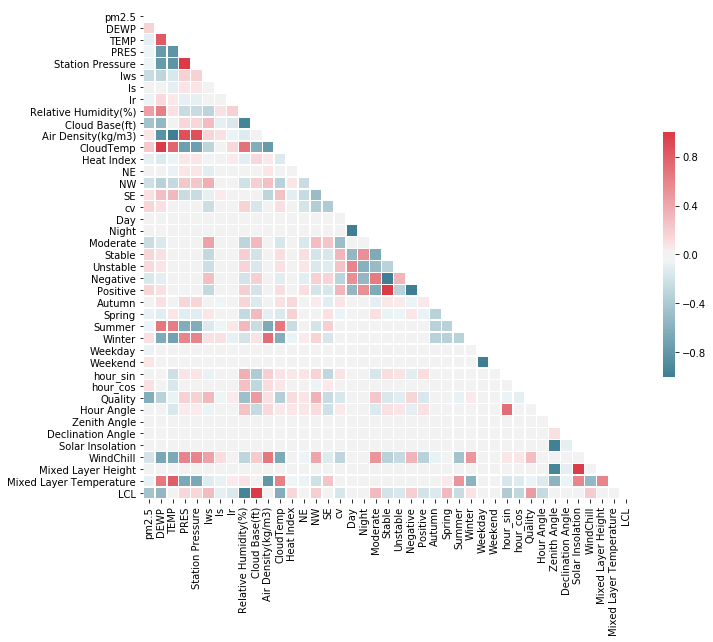

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

In [26]:
#Creating a correlation plot for the variables
import seaborn as sns
corr = RF.corr()
# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()
plt.figure(figsize=(50,50))

In [136]:
sns.pairplot(RF)
plt.show()

In [134]:
#Performing PCA for 10 components
pca10 = PCA(n_components=10, svd_solver='full')
pca10.fit(E)

PCA(copy=True, iterated_power='auto', n_components=10, random_state=None,
  svd_solver='full', tol=0.0, whiten=False)

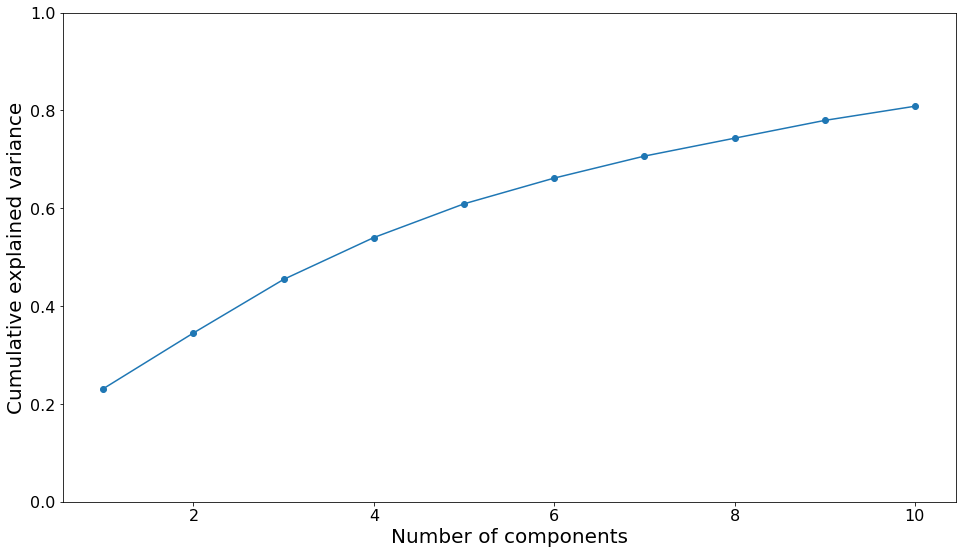

In [28]:
#Variance for components displayed in graph.
plt.plot(range(1,pca10.n_components+1), np.cumsum(pca10.explained_variance_ratio_),'-o')
plt.xlabel('Number of components', fontsize=20)
plt.ylabel('Cumulative explained variance', fontsize=20);
plt.tick_params(labelsize=16)
plt.ylim(0,1)

plt.show()

# 3.1 Random Forests-Case Example 

In [173]:
#Splitting the input and output into separate dataframes
y=RF['Quality']
X=RF.drop(columns=['Quality','pm2.5'])

In [174]:
#Standard test using normal condiitons
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.60)
#Create a Gaussian Classifier
rf1=RandomForestClassifier(n_estimators = 100, max_depth=2, class_weight='balanced')

#Train the model using the training sets y_pred=clf.predict(X_test)
rf1.fit(X_train,y_train)

# prediction on test set
y_pred=rf1.predict(X_test)

#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

('Accuracy:', 0.7519141757148419)


In [176]:
from sklearn.metrics import roc_curve, auc
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
roc_auc

0.7400561229183916

AUC: 0.83


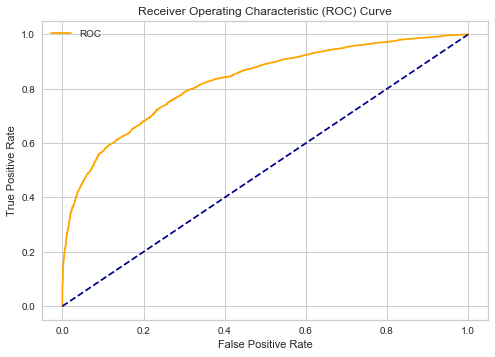

In [181]:
#Plot for testing dataset
pro1 = rf1.predict_proba(X_test) 
pro1 = pro1[:, 1]  
auc = roc_auc_score(y_test, pro1)
print('AUC: %.2f' % auc) 
fpr, tpr, thresholds = roc_curve(y_test, pro1)  
plot_roc_curve(fpr, tpr) 

AUC: 0.82


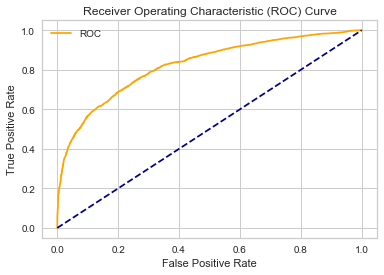

In [192]:
#Plot for training dataset
from sklearn.metrics import roc_curve, auc
y_pred1=rf1.predict(X_train)
false_positive_rate1, true_positive_rate1, thresholds1 = roc_curve(y_train, y_pred1)
roc_auc1 = auc(false_positive_rate1, true_positive_rate1)
roc_auc1
pro1_1 = rf1.predict_proba(X_train) 
pro1_1 = pro1_1[:, 1]  
auc = roc_auc_score(y_train, pro1_1)
print('AUC: %.2f' % auc) 
fpr1, tpr1, thresholds = roc_curve(y_train, pro1_1)  
plot_roc_curve(fpr1, tpr1)

AUC: 0.95


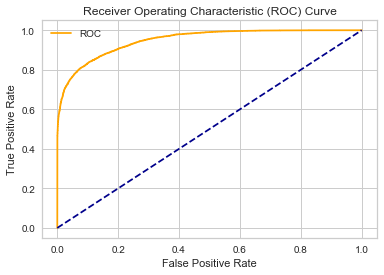

In [195]:
#Plot for training dataset for second model
from sklearn.metrics import roc_curve, auc
y_pred2=clf.predict(X_train)
false_positive_rate2, true_positive_rate2, thresholds2 = roc_curve(y_train, y_pred2)
roc_auc2 = auc(false_positive_rate2, true_positive_rate2)
roc_auc2
pro1_2 = clf.predict_proba(X_train) 
pro1_2 = pro1_2[:, 1]  
auc = roc_auc_score(y_train, pro1_2)
print('AUC: %.2f' % auc) 
fpr2, tpr2, thresholds2 = roc_curve(y_train, pro1_2)  
plot_roc_curve(fpr2, tpr2)

In [193]:
#Result from second random forest classifier.
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.60)
#Create a Gaussian Classifier
clf=RandomForestClassifier(n_estimators=200,max_depth=10)

#Train the model using the training sets y_pred=clf.predict(X_test)
clf.fit(X_train,y_train)

# prediction on test set
y_pred=clf.predict(X_test)

#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
from sklearn.metrics import roc_curve, auc
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
roc_auc

('Accuracy:', 0.8265345849374919)


0.7964638254113655

AUC: 0.89


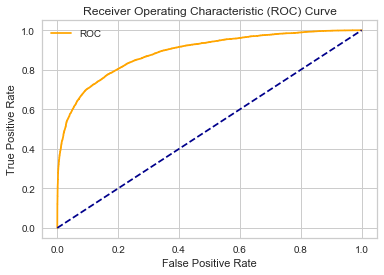

In [194]:
#Plot for testing dataset
probs5 = clf.predict_proba(X_test)  
probs5 = probs5[:, 1]  
auc = roc_auc_score(y_test, probs5)  
print('AUC: %.2f' % auc) 
fpr, tpr, thresholds = roc_curve(y_test, probs5)  
plot_roc_curve(fpr, tpr) 

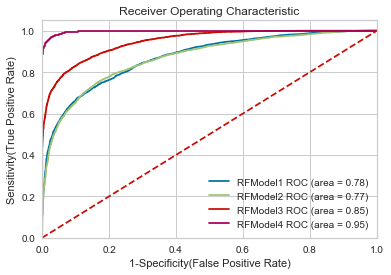

In [205]:
#Different ROC plots for training sets
plt.figure()

# Add the models to the list that you want to view on the ROC plot
models = [
{
    'label': 'RFModel1',
    'model': RandomForestClassifier(n_estimators=15,max_depth=5),
},
    {
    'label': 'RFModel2',
    'model': RandomForestClassifier(n_estimators=25,max_depth=5),
},
{
    'label': 'RFModel3',
    'model': RandomForestClassifier(n_estimators=50,max_depth=10),
},{
    'label': 'RFModel4',
    'model': RandomForestClassifier(n_estimators=150,max_depth=15),
}
]

# Below for loop iterates through your models list
for m in models:
    model = m['model'] # select the model
    model.fit(X_train, y_train) # train the model
    y_pred=model.predict(X_train) # predict the test data
# Compute False postive rate, and True positive rate
    fpr, tpr, thresholds = metrics.roc_curve(y_train, model.predict_proba(X_train)[:,1])
# Calculate Area under the curve to display on the plot
    auc = metrics.roc_auc_score(y_train,model.predict(X_train))
# Now, plot the computed values
    plt.plot(fpr, tpr, label='%s ROC (area = %0.2f)' % (m['label'], auc))
# Custom settings for the plot 
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('1-Specificity(False Positive Rate)')
plt.ylabel('Sensitivity(True Positive Rate)')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()   # Display

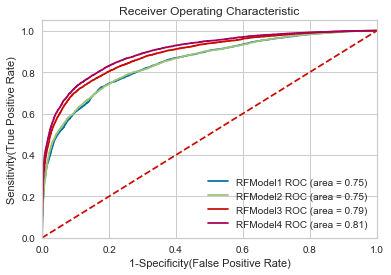

In [202]:
#Different ROC plots for testing sets
plt.figure()

# Add the models to the list that you want to view on the ROC plot
models = [
{
    'label': 'RFModel1',
    'model': RandomForestClassifier(n_estimators=15,max_depth=5),
},
    {
    'label': 'RFModel2',
    'model': RandomForestClassifier(n_estimators=25,max_depth=5),
},
{
    'label': 'RFModel3',
    'model': RandomForestClassifier(n_estimators=50,max_depth=10),
},{
    'label': 'RFModel4',
    'model': RandomForestClassifier(n_estimators=150,max_depth=15),
}
]

# Below for loop iterates through your models list
for m in models:
    model = m['model'] # select the model
    model.fit(X_train, y_train) # train the model
    y_pred=model.predict(X_test) # predict the test data
# Compute False postive rate, and True positive rate
    fpr, tpr, thresholds = metrics.roc_curve(y_test, model.predict_proba(X_test)[:,1])
# Calculate Area under the curve to display on the plot
    auc = metrics.roc_auc_score(y_test,model.predict(X_test))
# Now, plot the computed values
    plt.plot(fpr, tpr, label='%s ROC (area = %0.2f)' % (m['label'], auc))
# Custom settings for the plot 
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('1-Specificity(False Positive Rate)')
plt.ylabel('Sensitivity(True Positive Rate)')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()   # Display

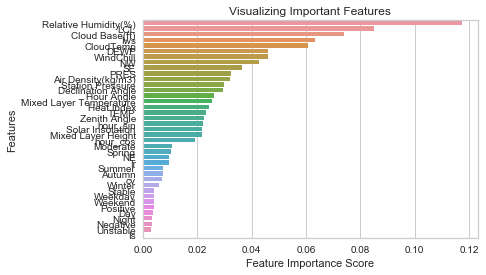

<Figure size 7200x7200 with 0 Axes>

<Figure size 7200x7200 with 0 Axes>

In [206]:
#Calculating and plotting the feature importance for above models
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
for m in models:
    feature_imp = pd.Series(m['model'].feature_importances_,index=X.columns).sort_values(ascending=False)

%matplotlib inline
# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index)
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.legend()
plt.show()
plt.figure(figsize=(100,100))

## 3.1.1 Parametric and Tree Tuning Tests

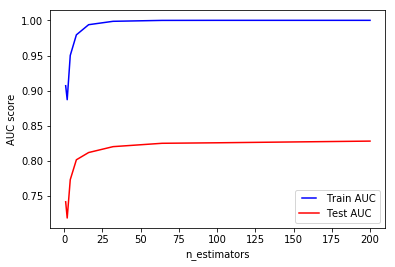

In [235]:
#N_estimators Test Results
n_estimators = [1, 2, 4, 8, 16, 32, 64, 100, 200]
train_results = []
test_results = []
for estimator in n_estimators:
   rf = RandomForestClassifier(n_estimators=estimator, n_jobs=-1)
   rf.fit(X_train, y_train)
   train_pred = rf.predict(X_train)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   train_results.append(roc_auc)
   y_pred = rf.predict(X_test)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   test_results.append(roc_auc)
from matplotlib.legend_handler import HandlerLine2D
line1, = plt.plot(n_estimators, train_results, 'b', label="Train AUC")
line2, = plt.plot(n_estimators, test_results, 'r', label="Test AUC")
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
plt.ylabel('AUC score')
plt.xlabel('n_estimators')
plt.show()

C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


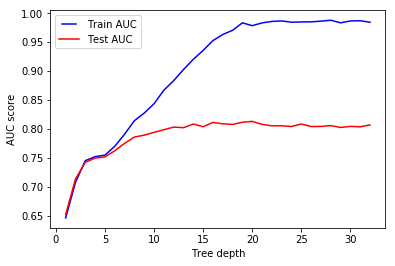

In [236]:
#Max_depths test results
max_depths = np.linspace(1, 32, 32, endpoint=True)
train_results = []
test_results = []
for max_depth in max_depths:
   rf = RandomForestClassifier(max_depth=max_depth, n_jobs=-1)
   rf.fit(X_train, y_train)
   train_pred = rf.predict(X_train)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   train_results.append(roc_auc)
   y_pred = rf.predict(X_test)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   test_results.append(roc_auc)
from matplotlib.legend_handler import HandlerLine2D
line1, = plt.plot(max_depths, train_results, 'b', label="Train AUC")
line2, = plt.plot(max_depths, test_results, 'r', label="Test AUC")
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
plt.ylabel('AUC score')
plt.xlabel('Tree depth')
plt.show()

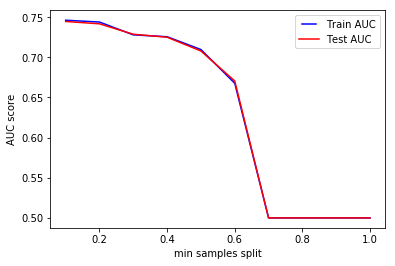

In [237]:
#Minimum sample splits test results
min_samples_splits = np.linspace(0.1, 1.0, 10, endpoint=True)
train_results = []
test_results = []
for min_samples_split in min_samples_splits:
   rf = RandomForestClassifier(min_samples_split=min_samples_split)
   rf.fit(X_train, y_train)
   train_pred = rf.predict(X_train)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   train_results.append(roc_auc)
   y_pred = rf.predict(X_test)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   test_results.append(roc_auc)
from matplotlib.legend_handler import HandlerLine2D
line1, = plt.plot(min_samples_splits, train_results, 'b', label='Train AUC')
line2, = plt.plot(min_samples_splits, test_results, 'r', label='Test AUC')
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
plt.ylabel('AUC score')
plt.xlabel('min samples split')
plt.show()

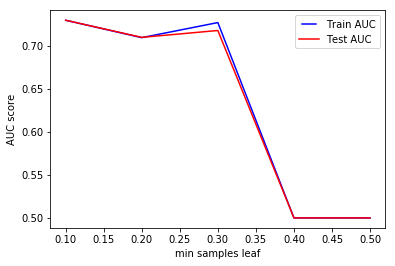

In [238]:
#Minimum sample leafs test results
min_samples_leafs = np.linspace(0.1, 0.5, 5, endpoint=True)
train_results = []
test_results = []
for min_samples_leaf in min_samples_leafs:
   rf = RandomForestClassifier(min_samples_leaf=min_samples_leaf)
   rf.fit(X_train, y_train)
   train_pred = rf.predict(X_train)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   train_results.append(roc_auc)
   y_pred = rf.predict(X_test)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   test_results.append(roc_auc)
from matplotlib.legend_handler import HandlerLine2D
line1, = plt.plot(min_samples_leafs, train_results, 'b', label='Train AUC')
line2, = plt.plot(min_samples_leafs, test_results, 'r', label='Test AUC')
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
plt.ylabel('AUC score')
plt.xlabel('min samples leaf')
plt.show()

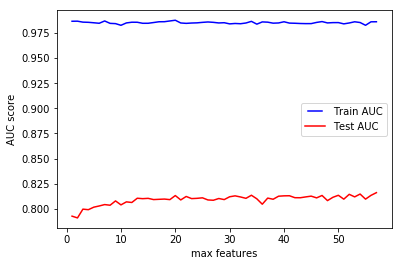

In [240]:
#Max features test results
max_features = list(range(1,X_train.shape[1]))
train_results = []
test_results = []
for max_feature in max_features:
   rf = RandomForestClassifier(max_features=max_feature)
   rf.fit(X_train, y_train)
   train_pred = rf.predict(X_train)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   train_results.append(roc_auc)
   y_pred = rf.predict(X_test)
   false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
   roc_auc = auc(false_positive_rate, true_positive_rate)
   test_results.append(roc_auc)
from matplotlib.legend_handler import HandlerLine2D
line1, = plt.plot(max_features, train_results, 'b', label='Train AUC')
line2, = plt.plot(max_features, test_results, 'r', label='Test AUC')
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
plt.ylabel('AUC score')
plt.xlabel('max features')
plt.show()

In [207]:
#Using a normal Treeing classifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.60)
#Create a Gaussian Classifier
clf1=RandomForestClassifier(n_estimators=200,max_depth=2)

#Train the model using the training sets y_pred=clf.predict(X_test)
clf1.fit(X_train,y_train)

# prediction on test set
y_pred=clf1.predict(X_test)

#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

('Accuracy:', 0.7724618246312238)


('Accuracy:', 0.77756148205827)
AUC: 0.83


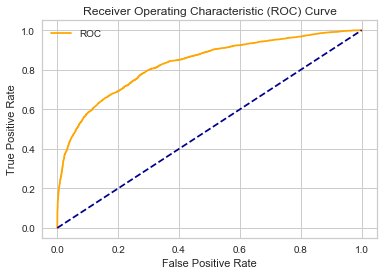

In [209]:
#Plotting ROC Curve for training data
# prediction on training data set
y_pred_1=clf1.predict(X_train)
print("Accuracy:",metrics.accuracy_score(y_train, y_pred_1))
probs_0 = clf1.predict_proba(X_train)  
probs_0 = probs_0[:, 1]  
auc = roc_auc_score(y_train, probs_0)  
print('AUC: %.2f' % auc) 
fpr1, tpr1, thresholds1 = roc_curve(y_train, probs_0)  
plot_roc_curve(fpr1, tpr1) 

AUC: 0.82


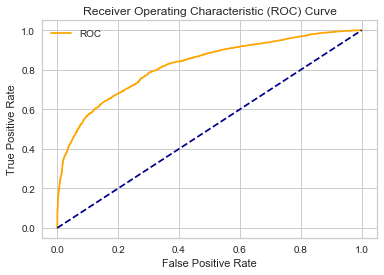

In [210]:
#Plotting ROC Curve for test data
probs0 = clf1.predict_proba(X_test)  
probs0 = probs0[:, 1]  
auc = roc_auc_score(y_test, probs0)  
print('AUC: %.2f' % auc) 
fpr, tpr, thresholds = roc_curve(y_test, probs0)  
plot_roc_curve(fpr, tpr) 

In [231]:
from sklearn.metrics import roc_curve, auc
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
roc_auc

0.7997970195805876

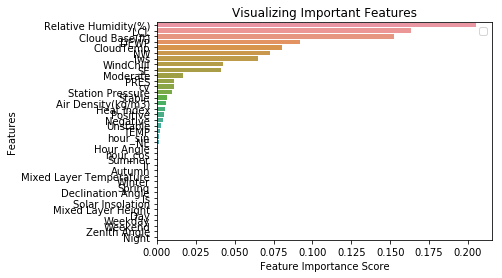

<Figure size 7200x7200 with 0 Axes>

<Figure size 7200x7200 with 0 Axes>

In [39]:
#Calculating and plotting the feature importance
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
feature_imp = pd.Series(clf1.feature_importances_,index=X.columns).sort_values(ascending=False)

%matplotlib inline
# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index)
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.legend()
plt.show()
plt.figure(figsize=(100,100))

In [83]:
Columns=X.columns
Columns
Target=[1,0]

## 3.2 Model Evaluation and Hypermetric Tuning 

In [137]:
from sklearn import model_selection
# random forest model creation
rfc = RandomForestClassifier()
rfc.fit(X_train,y_train)
# predictions
rfc_predict = rfc.predict(X_test)
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, confusion_matrix
rfc_cv_score = cross_val_score(rfc, X, y, cv=5, scoring='roc_auc')
print("=== Confusion Matrix ===")
print(confusion_matrix(y_test, rfc_predict))
print('\n')
print("=== Classification Report ===")
print(classification_report(y_test, rfc_predict))
print('\n')
print("=== All AUC Scores ===")
print(rfc_cv_score)
print('\n')
print("=== Mean AUC Score ===")
print("Mean AUC Score - Random Forest: ", rfc_cv_score.mean())

=== Confusion Matrix ===
[[13175  1240]
 [ 2807  5895]]


=== Classification Report ===
              precision    recall  f1-score   support

           0       0.82      0.91      0.87     14415
           1       0.83      0.68      0.74      8702

   micro avg       0.82      0.82      0.82     23117
   macro avg       0.83      0.80      0.81     23117
weighted avg       0.83      0.82      0.82     23117



=== All AUC Scores ===
[0.87562463 0.8504092  0.84543004 0.84491609 0.83104506]


=== Mean AUC Score ===
('Mean AUC Score - Random Forest: ', 0.849485003093941)


In [65]:
from sklearn import model_selection
# random forest model creation
rfc = RandomForestClassifier()
rfc.fit(X_train,y_train)
# predictions
rfc_predict = rfc.predict(X_test)
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, confusion_matrix
rfc_cv_score = cross_val_score(rfc, X, y, cv=10, scoring='roc_auc')
print("=== Confusion Matrix ===")
print(confusion_matrix(y_test, rfc_predict))
print('\n')
print("=== Classification Report ===")
print(classification_report(y_test, rfc_predict))
print('\n')
print("=== All AUC Scores ===")
print(rfc_cv_score)
print('\n')
print("=== Mean AUC Score ===")
print("Mean AUC Score - Random Forest: ", rfc_cv_score.mean())

C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


=== Confusion Matrix ===
[[6622  586]
 [1332 3019]]


=== Classification Report ===
              precision    recall  f1-score   support

           0       0.83      0.92      0.87      7208
           1       0.84      0.69      0.76      4351

   micro avg       0.83      0.83      0.83     11559
   macro avg       0.83      0.81      0.82     11559
weighted avg       0.83      0.83      0.83     11559



=== All AUC Scores ===
[0.85521545 0.89634294 0.82824571 0.86877347 0.79373227 0.87396366
 0.81610609 0.88114784 0.81998192 0.84644234]


=== Mean AUC Score ===
('Mean AUC Score - Random Forest: ', 0.8479951695455237)


In [138]:
from sklearn import model_selection
# random forest model creation
rfc = RandomForestClassifier()
rfc.fit(X_train,y_train)
# predictions
rfc_predict = rfc.predict(X_test)
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, confusion_matrix
rfc_cv_score = cross_val_score(rfc, X, y, cv=15, scoring='roc_auc')
print("=== Confusion Matrix ===")
print(confusion_matrix(y_test, rfc_predict))
print('\n')
print("=== Classification Report ===")
print(classification_report(y_test, rfc_predict))
print('\n')
print("=== All AUC Scores ===")
print(rfc_cv_score)
print('\n')
print("=== Mean AUC Score ===")
print("Mean AUC Score - Random Forest: ", rfc_cv_score.mean())

=== Confusion Matrix ===
[[13219  1196]
 [ 2872  5830]]


=== Classification Report ===
              precision    recall  f1-score   support

           0       0.82      0.92      0.87     14415
           1       0.83      0.67      0.74      8702

   micro avg       0.82      0.82      0.82     23117
   macro avg       0.83      0.79      0.80     23117
weighted avg       0.82      0.82      0.82     23117



=== All AUC Scores ===
[0.88774505 0.809508   0.91647692 0.83925133 0.80001976 0.90140507
 0.86791702 0.76220105 0.88516383 0.8695351  0.79246652 0.90325071
 0.82639546 0.7502888  0.8957725 ]


=== Mean AUC Score ===
('Mean AUC Score - Random Forest: ', 0.8471598083534961)


In [69]:
#Performing Randomized Search
from sklearn.model_selection import RandomizedSearchCV
# number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# number of features at every split
max_features = ['auto', 'sqrt']

# max depth
max_depth = [int(x) for x in np.linspace(100, 500, num = 11)]
max_depth.append(None)
# create random grid
random_grid = {
 'n_estimators': n_estimators,
 'max_features': max_features,
 'max_depth': max_depth
 }
# Random search of parameters
rfc_random = RandomizedSearchCV(estimator = rfc, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the model
rfc_random.fit(X_train, y_train)
# print results
print(rfc_random.best_params_)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed: 37.3min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 74.1min finished


{'n_estimators': 1000, 'max_features': 'auto', 'max_depth': 420}


In [139]:
#Tuning Parameters
rfc = RandomForestClassifier(n_estimators=600, max_depth=300, max_features='sqrt')
rfc.fit(X_train,y_train)
rfc_predict = rfc.predict(X_test)
rfc_cv_score = cross_val_score(rfc, X, y, cv=20, scoring='roc_auc')
print("=== Confusion Matrix ===")
print(confusion_matrix(y_test, rfc_predict))
print('\n')
print("=== Classification Report ===")
print(classification_report(y_test, rfc_predict))
print('\n')
print("=== All AUC Scores ===")
print(rfc_cv_score)
print('\n')
print("=== Mean AUC Score ===")
print("Mean AUC Score - Random Forest: ", rfc_cv_score.mean())

=== Confusion Matrix ===
[[13219  1196]
 [ 2461  6241]]


=== Classification Report ===
              precision    recall  f1-score   support

           0       0.84      0.92      0.88     14415
           1       0.84      0.72      0.77      8702

   micro avg       0.84      0.84      0.84     23117
   macro avg       0.84      0.82      0.83     23117
weighted avg       0.84      0.84      0.84     23117



=== All AUC Scores ===
[0.92270877 0.81582359 0.87199072 0.93550424 0.8808716  0.81301982
 0.84614316 0.94766192 0.89831519 0.72565062 0.85055754 0.93044856
 0.92438305 0.75120368 0.89380498 0.92593606 0.87506377 0.79778408
 0.81141985 0.93959193]


=== Mean AUC Score ===
('Mean AUC Score - Random Forest: ', 0.8678941568355674)


## 3.3 ROC CURVES- USING NORMAL CONDITIONS

In [26]:
import seaborn as sns  
# roc curve and auc score
from sklearn.datasets import make_classification  
from sklearn.neighbors import KNeighborsClassifier  
from sklearn.ensemble import RandomForestClassifier  
from sklearn.model_selection import train_test_split  
from sklearn.metrics import roc_curve  
from sklearn.metrics import roc_auc_score 

In [27]:
def plot_roc_curve(fpr, tpr):  
    plt.plot(fpr, tpr, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

In [226]:
X=RF.drop(columns=['pm2.5','Quality'])
y=RF['Quality']

In [227]:
trainX, testX, trainy, testy = train_test_split(X, y, test_size=0.6, random_state=1)  

In [228]:
model12 = RandomForestClassifier()  
model12.fit(trainX, trainy)  

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

('Accuracy:', 0.9870871455453897)
AUC: 0.88


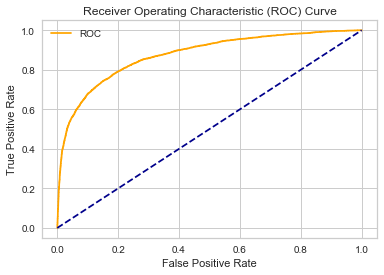

In [229]:
#Plotting ROC Curve for training data
#prediction on training data set
y_predn=model12.predict(trainX)
print("Accuracy:",metrics.accuracy_score(trainy, y_predn))
probs_n = model2.predict_proba(trainX)  
probs_n = probs_n[:, 1]  
auc = roc_auc_score(trainy, probs_n)  
print('AUC: %.2f' % auc) 
fprn, tprn, thresholdsn = roc_curve(trainy, probs_n)  
plot_roc_curve(fprn, tprn) 

In [230]:
probs = model12.predict_proba(testX)  
probs = probs[:, 1]  
auc = roc_auc_score(testy, probs)  
print('AUC: %.2f' % auc) 

AUC: 0.88


In [231]:
from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

('Accuracy:', 0.7724618246312238)


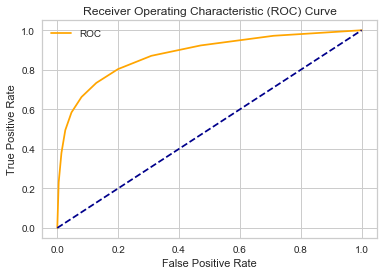

In [232]:
#ROC Curve for testing data
fpr, tpr, thresholds = roc_curve(testy, probs)  
plot_roc_curve(fpr, tpr)  

## 3.4 ROC CURVE USING TUNED PARAMETERS 

In [119]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.60)
#Create a Gaussian Classifier
om=RandomForestClassifier(n_estimators=1000,max_features='auto',max_depth=420)

#Train the model using the training sets y_pred=clf.predict(X_test)
om.fit(X_train,y_train)

# prediction on test set
y_pred=om.predict(X_test)

#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

('Accuracy:', 0.8391227235367911)


In [41]:
from sklearn.metrics import roc_curve, auc
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
roc_auc

0.8144694778674777

('Accuracy:', 0.9069495814677827)
AUC: 0.96


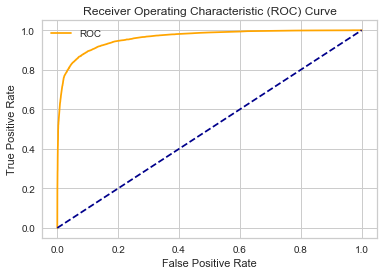

In [233]:
#Plotting ROC Curve for training data
#prediction on training data set
y_omn=om.predict(X_train)
print("Accuracy:",metrics.accuracy_score(y_train, y_omn))
probs_n1 = om.predict_proba(X_train)  
probs_n1 = probs_n1[:, 1]  
auc = roc_auc_score(y_train, probs_n1)  
print('AUC: %.2f' % auc) 
fprn1, tprn1, thresholdsn1 = roc_curve(y_train, probs_n1)  
plot_roc_curve(fprn1, tprn1) 

AUC: 0.96


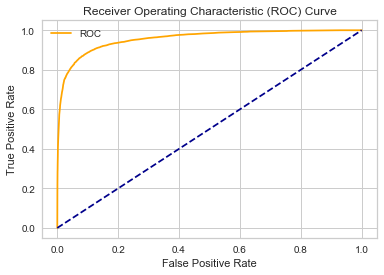

('Accuracy:', 0.7724618246312238)


In [234]:
#Plotting ROC curve for testing data
probs1 = om.predict_proba(X_test)  
probs1 = probs1[:, 1]  
auc = roc_auc_score(y_test, probs1)  
print('AUC: %.2f' % auc) 
fpr, tpr, thresholds = roc_curve(y_test, probs1)  
plot_roc_curve(fpr, tpr) 
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

In [123]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_true, y)

array([[24048,     0],
       [    0, 14480]], dtype=int64)

# Logistic Regression Tests

## Using Cross Validation Tests

In [246]:
from sklearn.linear_model import LogisticRegression
# instantiate a logistic regression model, and fit with X and y
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.70)
lm1 = LogisticRegression()
lm1 = lm1.fit(X, y)
# check the accuracy on the training set
lm1.score(X, y)

0.8123442691029901

AUC: 0.79


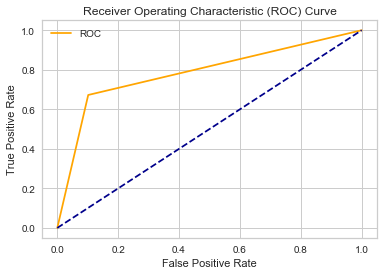

('Accuracy:', 0.8134625367710676)


In [254]:
#Plotting ROC curve for training data
lm1.fit(X_train,y_train)
pd = lm1.predict(X_train)
auc = roc_auc_score(y_train, pd)  
print('AUC: %.2f' % auc) 
fpr, tpr, thresholds = roc_curve(y_train, pd)  
plot_roc_curve(fpr, tpr) 
print('Accuracy:',lm1.score(X_train, y_train))

AUC: 0.87


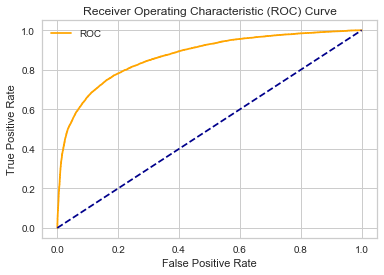

('Accuracy:', 0.8112347052280311)


In [250]:
#Plotting ROC curve for test data
prob_l1 = lm1.predict_proba(X_test)  
prob_l1 = prob_l1[:, 1]  
auc = roc_auc_score(y_test, prob_l1)  
print('AUC: %.2f' % auc) 
fpr, tpr, thresholds = roc_curve(y_test, prob_l1)  
plot_roc_curve(fpr, tpr) 
print('Accuracy:',lm1.score(X_test, y_test))

In [260]:
from sklearn.metrics import classification_report
print(classification_report(y_test,lm1.predict(X_test)))

              precision    recall  f1-score   support

           0       0.82      0.89      0.85     16835
           1       0.79      0.68      0.73     10135

   micro avg       0.81      0.81      0.81     26970
   macro avg       0.81      0.78      0.79     26970
weighted avg       0.81      0.81      0.81     26970



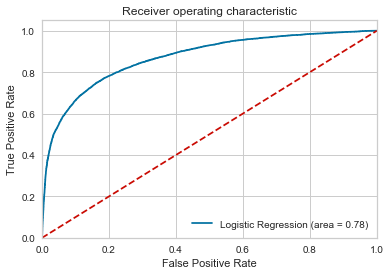

In [274]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, lm1.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, lm1.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

In [272]:
import statsmodels.api as sm
import sklearn.linear_model as lm
logit_model=lm1.Logit(y,X)
result=logit_model.fit()
print(result.summary2())

AttributeError: 'LogisticRegression' object has no attribute 'Logit'

In [157]:
# examine the coefficients
pd.DataFrame(zip(X.columns, np.transpose(model.coef_)))

,0,1
0,DEWP,[-0.002629311588100518]
1,TEMP,[-0.0026289348541415763]
2,PRES,[-0.00117432112433603]
3,Station Pressure,[-0.0011340025047453333]
4,Iws,[0.007938774817910586]
5,Is,[0.07974896682501716]
6,Ir,[0.26227781299895175]
7,Relative Humidity(%),[-0.04645290773836859]
8,Cloud Base(ft),[0.00015322873985801984]
9,Air Density(kg/m3),[0.10786426876283493]


In [65]:
# evaluate the model using 10-fold cross-validation
from sklearn.model_selection import cross_val_score
scores = cross_val_score(LogisticRegression(), X, y, scoring='accuracy', cv=10)
lm_10=LogisticRegression(C=10)
print scores
print scores.mean()

[0.8006748  0.84220088 0.78276668 0.83130029 0.77342331 0.84038412
 0.79029328 0.81417078 0.79023884 0.80451713]
0.8069970089792611


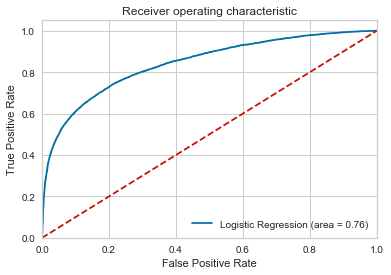

In [276]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, lm_10.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, lm_10.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

In [261]:
from sklearn.linear_model import LogisticRegressionCV
lm_10 = LogisticRegressionCV(cv=10, random_state=0).fit(X, y)
print scores
print scores.mean()

C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iteration

C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iteration

C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iteration

[0.8006748  0.84220088 0.78276668 0.83130029 0.77342331 0.84038412
 0.79029328 0.81417078 0.79023884 0.80451713]
0.8069970089792611


C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


In [263]:
from sklearn.metrics import classification_report
print(classification_report(y_test,lm_10.predict(X_test)))

              precision    recall  f1-score   support

           0       0.80      0.88      0.84     16835
           1       0.76      0.64      0.70     10135

   micro avg       0.79      0.79      0.79     26970
   macro avg       0.78      0.76      0.77     26970
weighted avg       0.79      0.79      0.79     26970



AttributeError: 'numpy.ndarray' object has no attribute 'DataFrame'

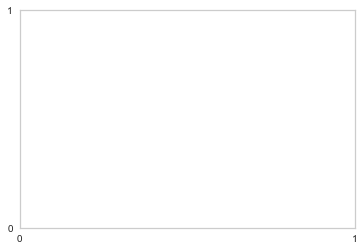

In [262]:
#Creating Confusion Matrix
from sklearn import metrics
y_pred=lm_10.predict(X_test)
cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
cnf_matrix
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [265]:
#Using 5 Cross Folds
lm_5_1 = LogisticRegressionCV(cv=5, penalty='l2',random_state=0).fit(X, y)
print scores
print scores.mean()
from sklearn.metrics import classification_report
print(classification_report(y_test,lm_5_1.predict(X_test)))

C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iteration

C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iteration

[0.8006748  0.84220088 0.78276668 0.83130029 0.77342331 0.84038412
 0.79029328 0.81417078 0.79023884 0.80451713]
0.8069970089792611
              precision    recall  f1-score   support

           0       0.81      0.87      0.84     16835
           1       0.76      0.66      0.70     10135

   micro avg       0.79      0.79      0.79     26970
   macro avg       0.78      0.77      0.77     26970
weighted avg       0.79      0.79      0.79     26970



C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


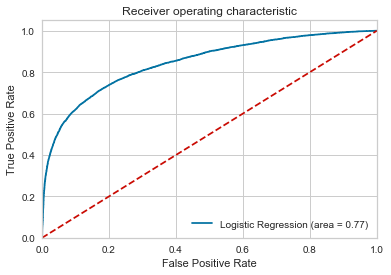

In [277]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, lm_5_1.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, lm_5_1.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

In [161]:
# evaluate the model using 15-fold cross-validation
from sklearn.model_selection import cross_val_score
scores = cross_val_score(LogisticRegression(), X, y, scoring='accuracy', cv=15)
print scores
print scores.mean()

[0.82841121 0.77973074 0.85415108 0.775159   0.78301534 0.85484474
 0.81705948 0.74373363 0.86569398 0.8402544  0.76356154 0.79498691
 0.80359147 0.72353161 0.8600823 ]
0.8058538295484503


In [162]:
# evaluate the model using 5-fold cross-validation
from sklearn.model_selection import cross_val_score
scores = cross_val_score(LogisticRegression(), X, y, scoring='accuracy', cv=5)
print scores
print scores.mean()

[0.8239621  0.80897756 0.8117207  0.80346677 0.79685746]
0.8089969167613582


In [268]:
#Using 5 Cross Folds
lm_5_2 = LogisticRegressionCV(Cs=10,cv=5, penalty='l2',random_state=0).fit(X, y)
print scores
print scores.mean()
from sklearn.metrics import classification_report
print(classification_report(y_test,lm_5_2.predict(X_test)))

C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iteration

C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iteration

[0.8006748  0.84220088 0.78276668 0.83130029 0.77342331 0.84038412
 0.79029328 0.81417078 0.79023884 0.80451713]
0.8069970089792611
              precision    recall  f1-score   support

           0       0.81      0.87      0.84     16835
           1       0.76      0.66      0.70     10135

   micro avg       0.79      0.79      0.79     26970
   macro avg       0.78      0.77      0.77     26970
weighted avg       0.79      0.79      0.79     26970



C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


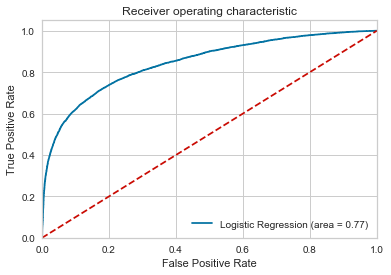

In [278]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, lm_5_2.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, lm_5_2.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

In [186]:
# evaluate the model using 3-fold cross-validation
from sklearn.model_selection import cross_val_score
scores = cross_val_score(LogisticRegression(), X, y, scoring='accuracy', cv=3)
print scores
print scores.mean()

[0.8066133  0.82762233 0.78639832]
0.806877983607626


In [269]:
lm_3_1 = LogisticRegressionCV(Cs=10,cv=3, penalty='l2',random_state=0).fit(X, y)
print scores
print scores.mean()
from sklearn.metrics import classification_report
print(classification_report(y_test,lm_3_1.predict(X_test)))

C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iteration

[0.8006748  0.84220088 0.78276668 0.83130029 0.77342331 0.84038412
 0.79029328 0.81417078 0.79023884 0.80451713]
0.8069970089792611
              precision    recall  f1-score   support

           0       0.79      0.88      0.83     16835
           1       0.76      0.62      0.68     10135

   micro avg       0.78      0.78      0.78     26970
   macro avg       0.78      0.75      0.76     26970
weighted avg       0.78      0.78      0.78     26970



C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


In [270]:
lm_3_2 = LogisticRegressionCV(Cs=1,cv=3, penalty='l2',random_state=0).fit(X, y)
print scores
print scores.mean()
from sklearn.metrics import classification_report
print(classification_report(y_test,lm_3_2.predict(X_test)))

C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


[0.8006748  0.84220088 0.78276668 0.83130029 0.77342331 0.84038412
 0.79029328 0.81417078 0.79023884 0.80451713]
0.8069970089792611
              precision    recall  f1-score   support

           0       0.78      0.89      0.83     16835
           1       0.75      0.58      0.66     10135

   micro avg       0.77      0.77      0.77     26970
   macro avg       0.77      0.73      0.74     26970
weighted avg       0.77      0.77      0.76     26970



C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


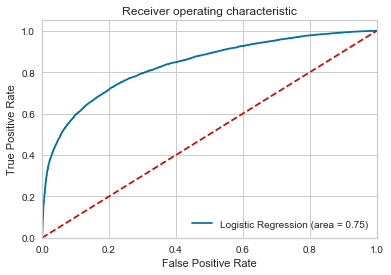

In [279]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, lm_3_1.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, lm_3_1.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

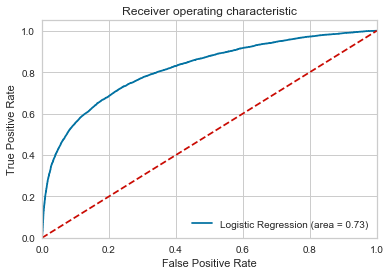

In [280]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, lm_3_2.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, lm_3_2.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

In [102]:
#Logistic Regression Model using different C
from sklearn.linear_model import LogisticRegression
# instantiate a logistic regression model, and fit with X and y
model = LogisticRegression(fit_intercept=True, C = 10)
model = model.fit(X, y)

# check the accuracy on the training set
model.score(X, y)

0.8126816860465116

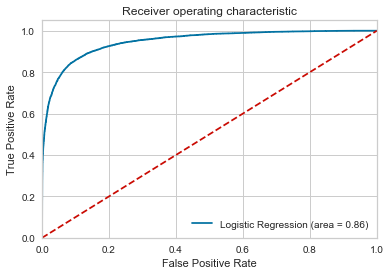

In [281]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, model.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, model.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

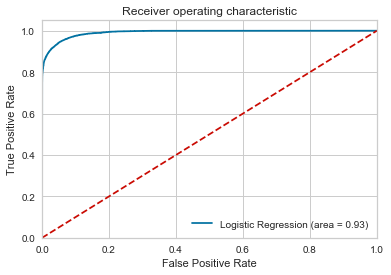

In [282]:
# instantiate a logistic regression model, and fit with X and y
model1 = LogisticRegression(fit_intercept=True, C = 5)
model1 = model.fit(X, y)

# check the accuracy on the training set
model.score(X, y)
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, model1.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, model1.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

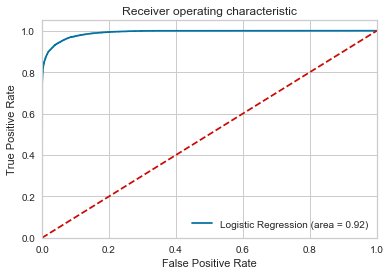

In [283]:
# instantiate a logistic regression model, and fit with X and y
model2 = LogisticRegression(fit_intercept=True, C = 0.001)
model2 = model.fit(X, y)

# check the accuracy on the training set
model.score(X, y)
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, model2.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, model2.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

In [103]:
# examine the coefficients
pd.DataFrame(zip(X.columns, np.transpose(model.coef_)))

,0,1
0,DEWP,[0.007511019047587711]
1,TEMP,[0.007511517035213366]
2,PRES,[-0.002789118714700324]
3,Station Pressure,[-0.0026947791763396933]
4,Iws,[0.005164545754527658]
5,Is,[0.05594632901623517]
6,Ir,[0.2567726447886258]
7,Relative Humidity(%),[-0.0442261385958543]
8,Cloud Base(ft),[0.00020302242460545447]
9,Air Density(kg/m3),[0.15557541848822998]


Text(0.5,352.48,'Predicted label')

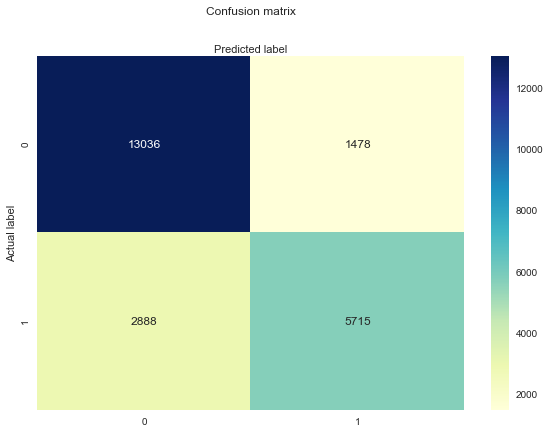

In [104]:
#Creating Confusion Matrix
from sklearn import metrics
y_pred=model.predict(X_test)
cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
cnf_matrix
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

AttributeError: 'numpy.ndarray' object has no attribute 'DataFrame'

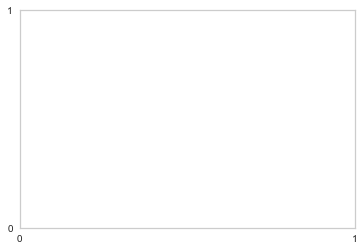

In [285]:
#Creating Confusion Matrix
from sklearn import metrics
y_pred=model2.predict(X_test)
cnf_matrix1 = metrics.confusion_matrix(y_test, y_pred)
cnf_matrix1
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix1), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

## Using A Validation Set

In [8]:
# evaluate the model by splitting into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, random_state=0)
model2 = LogisticRegression()
model2.fit(X_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [15]:
import seaborn as sns
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score 
prob_l2 = model2.predict_proba(X_test)  
prob_l2 = prob_l2[:, 1]  
auc = roc_auc_score(y_test, prob_l2)  
print('AUC: %.2f' % auc) 

AUC: 0.87


Text(0.5,320.8,'Predicted label')

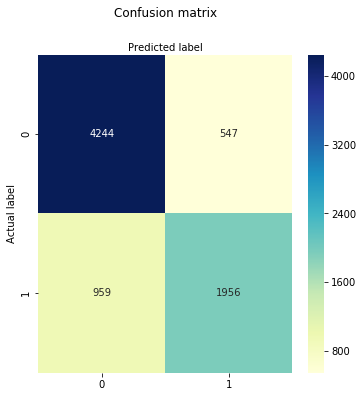

In [62]:
#Creating Confusion Matrix
from sklearn import metrics
y_pred=model2.predict(X_test)
cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
cnf_matrix
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

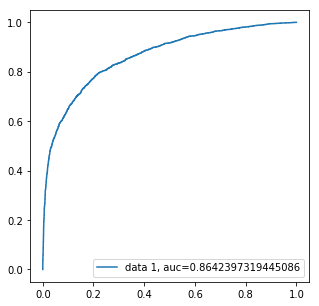

In [59]:
#ROC Curve for Model
y_pred_proba = model2.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

In [164]:
# predict class labels for the test set
predicted = model2.predict(X_test)
print predicted

[0 0 1 ... 0 1 0]


In [165]:
# generate class probabilities
probs = model2.predict_proba(X_test)
print probs


[[0.54076667 0.45923333]
 [0.89484272 0.10515728]
 [0.41575653 0.58424347]
 ...
 [0.97767158 0.02232842]
 [0.43216919 0.56783081]
 [0.95244531 0.04755469]]


In [166]:
# generate evaluation metrics
print metrics.accuracy_score(y_test, predicted)
print metrics.roc_auc_score(y_test, probs[:, 1])

0.8112219451371571
0.8681209182268154


## Logistic Regression Tuning

## Using L1 Regularization 

In [45]:
from sklearn.linear_model import LogisticRegression
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [46]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)


In [47]:
# Create a scaler object
sc = StandardScaler()

# Fit the scaler to the training data and transform
X_train_std = sc.fit_transform(X_train)

# Apply the scaler to the test data
X_test_std = sc.transform(X_test)

C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\preprocessing\data.py:625: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\base.py:462: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)
C:\Users\Amardeep\Anaconda2\lib\site-packages\ipykernel_launcher.py:8: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  


In [48]:
C = [10, 1, .1, .001]

for c in C:
    clf = LogisticRegression(penalty='l1', C=c)
    clf.fit(X_train, y_train)
    print('C:', c)
    print('Coefficient of each feature:', clf.coef_)
    print('Training accuracy:', clf.score(X_train, y_train))
    print('Test accuracy:', clf.score(X_test, y_test))
    print('')

C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\svm\base.py:922: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


('C:', 10)
('Coefficient of each feature:', array([[ 1.93171964e-02,  3.15990159e-02,  9.58128836e-03,
         1.01125037e-02,  4.84172969e-03,  6.47751869e-02,
         2.63017956e-01, -3.93742522e-02,  1.08675583e-04,
         3.23665372e-01,  9.95655564e-03,  5.81027752e-03,
        -3.46080330e+00, -3.51037398e+00, -5.12217900e+00,
        -4.35051891e+00, -5.38220573e+00, -5.39385068e+00,
        -4.83652724e+00, -5.37636908e+00, -4.62732543e+00,
        -5.26036290e+00, -4.59807189e+00, -4.09622427e+00,
        -5.41399548e+00, -3.19251485e+00, -5.66812615e+00,
        -5.05639776e+00, -5.22798571e+00,  3.67232854e-01,
         4.42915420e-01,  9.37352424e-05,  6.00304765e-03,
        -5.58856074e-04, -5.43398551e-04,  5.59453300e-04,
         6.17664887e-03,  9.35827062e-03,  5.70959668e-04]]))
('Training accuracy:', 0.8144536319477919)
('Test accuracy:', 0.8157280041526084)

('C:', 1)
('Coefficient of each feature:', array([[ 5.53951368e-03,  2.08806454e-02,  4.89505725e-03,
 

In [54]:
import math

from sklearn.model_selection import train_test_split

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.metrics import mean_squared_error

from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

import matplotlib.pyplot as plt
import seaborn as sns
steps = [
    ('scalar', StandardScaler()),
    ('poly', PolynomialFeatures(degree=2)),
    ('model', Lasso(alpha=0.001, fit_intercept=True))
]

lasso_pipe = Pipeline(steps)

lasso_pipe.fit(X_train, y_train)

print('Training score: {}'.format(lasso_pipe.score(X_train, y_train)))
print('Test score: {}'.format(lasso_pipe.score(X_test, y_test)))

C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\preprocessing\data.py:625: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\base.py:465: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, y, **fit_params).transform(X)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\pipeline.py:511: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  Xt = transform.transform(Xt)


Training score: 0.472057968016


C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\pipeline.py:511: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  Xt = transform.transform(Xt)


Test score: 0.465853555787


In [57]:
steps = [
    ('scalar', StandardScaler()),
    ('poly', PolynomialFeatures(degree=2)),
    ('model', Lasso(alpha=0.003, fit_intercept=True))
]

lasso_pipe = Pipeline(steps)

lasso_pipe.fit(X_train, y_train)

print('Training score: {}'.format(lasso_pipe.score(X_train, y_train)))
print('Test score: {}'.format(lasso_pipe.score(X_test, y_test)))

C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\preprocessing\data.py:625: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\base.py:465: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, y, **fit_params).transform(X)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\pipeline.py:511: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  Xt = transform.transform(Xt)


Training score: 0.45627154248
Test score: 0.453370032939


C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\pipeline.py:511: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  Xt = transform.transform(Xt)


## Using L2 Regularization

In [55]:
#Ridge Pipe L1 regularization step
steps = [
    ('scalar', StandardScaler()),
    ('poly', PolynomialFeatures(degree=2)),
    ('model', Ridge(alpha=10, fit_intercept=True))
]

ridge_pipe = Pipeline(steps)
ridge_pipe.fit(X_train, y_train)

print('Training Score: {}'.format(ridge_pipe.score(X_train, y_train)))
print('Test Score: {}'.format(ridge_pipe.score(X_test, y_test)))

C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\preprocessing\data.py:625: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\base.py:465: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, y, **fit_params).transform(X)
C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\pipeline.py:511: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  Xt = transform.transform(Xt)


Training Score: 0.484834588146
Test Score: 0.474180442804


C:\Users\Amardeep\Anaconda2\lib\site-packages\sklearn\pipeline.py:511: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  Xt = transform.transform(Xt)


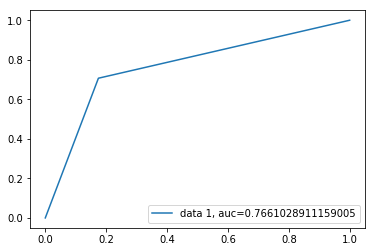

In [80]:
y_pred_proba = model.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

In [45]:
from sklearn import linear_model, datasets
from sklearn.model_selection import GridSearchCV
logistic = linear_model.LogisticRegression()
# Create regularization penalty space
penalty = ['l1', 'l2']

# Create regularization hyperparameter space
C = np.logspace(0, 4, 10)

# Create hyperparameter options
hyperparameters = dict(C=C, penalty=penalty)

# XG-BOOSTING METHODS

## Case 1 

In [36]:
!pip install xgboost

In [44]:
import xgboost as xgb
from xgboost.sklearn import XGBClassifier
from sklearn.metrics import mean_squared_error

In [45]:
data_dmatrix = xgb.DMatrix(data=X,label=y)

C:\Users\Amardeep\Anaconda2\lib\site-packages\xgboost\core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
C:\Users\Amardeep\Anaconda2\lib\site-packages\xgboost\core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


In [46]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)

In [47]:
xg_reg = xgb.XGBRegressor(objective ='reg:linear', colsample_bytree = 0.3, learning_rate = 0.1,
                max_depth = 5, alpha = 10, n_estimators = 10)

In [48]:
xg_reg.fit(X_train,y_train)

preds = xg_reg.predict(X_test)

In [49]:
rmse = np.sqrt(mean_squared_error(y_test, preds))
print("RMSE: %f" % (rmse))

RMSE: 0.414571


In [53]:
!pip install graphviz

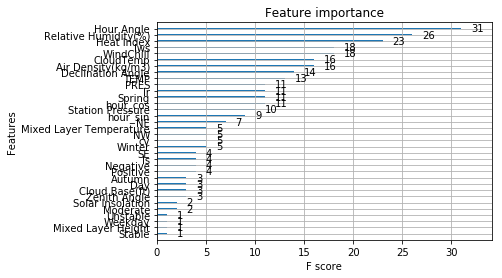

In [50]:
xgb.plot_importance(xg_reg)
plt.rcParams['figure.figsize'] = [5, 5]
plt.show()

## Case 2

In [63]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, random_state=123)
xg1 = xgb.XGBRegressor(objective ='reg:linear', colsample_bytree = 0.3, learning_rate = 0.1,
                max_depth = 5, alpha = 10, n_estimators = 10)
xg1.fit(X_train,y_train)

preds = xg1.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, preds))
print("RMSE: %f" % (rmse))


RMSE: 0.412800


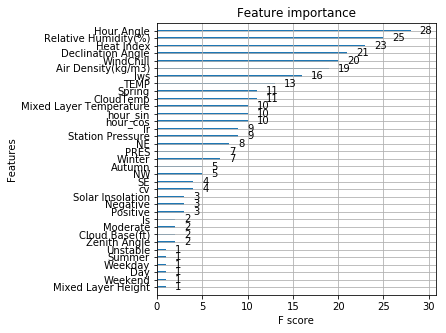

In [64]:
xgb.plot_importance(xg1)
plt.rcParams['figure.figsize'] = [5, 5]
plt.show()

In [72]:
# use feature importance for feature selection
from numpy import loadtxt
from numpy import sort
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.feature_selection import SelectFromModel
# split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=7)
# fit model on all training data
modelgb = XGBClassifier()
modelgb.fit(X_train, y_train)
# make predictions for test data and evaluate
y_pred = modelgb.predict(X_test)
predictions = [round(value) for value in y_pred]
accuracy = accuracy_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))
# Fit model using each importance as a threshold
thresholds = sort(modelgb.feature_importances_)
for thresh in thresholds:
	# select features using threshold
	selection = SelectFromModel(modelgb, threshold=thresh, prefit=True)
	select_X_train = selection.transform(X_train)
	# train model
	selection_model = XGBClassifier()
	selection_model.fit(select_X_train, y_train)
	# eval model
	select_X_test = selection.transform(X_test)
	y_pred = selection_model.predict(select_X_test)
	predictions = [round(value) for value in y_pred]
	accuracy = accuracy_score(y_test, predictions)
	print("Thresh=%.3f, n=%d, Accuracy: %.2f%%" % (thresh, select_X_train.shape[1], accuracy*100.0))

Accuracy: 83.22%
Thresh=0.000, n=39, Accuracy: 83.22%
Thresh=0.000, n=39, Accuracy: 83.22%
Thresh=0.000, n=39, Accuracy: 83.22%
Thresh=0.000, n=39, Accuracy: 83.22%
Thresh=0.000, n=39, Accuracy: 83.22%
Thresh=0.000, n=39, Accuracy: 83.22%
Thresh=0.000, n=39, Accuracy: 83.22%
Thresh=0.000, n=39, Accuracy: 83.22%
Thresh=0.000, n=39, Accuracy: 83.22%
Thresh=0.000, n=39, Accuracy: 83.22%
Thresh=0.000, n=39, Accuracy: 83.22%
Thresh=0.000, n=39, Accuracy: 83.22%
Thresh=0.002, n=27, Accuracy: 83.22%
Thresh=0.002, n=26, Accuracy: 83.18%
Thresh=0.002, n=25, Accuracy: 83.26%
Thresh=0.003, n=24, Accuracy: 83.26%
Thresh=0.006, n=23, Accuracy: 83.26%
Thresh=0.007, n=22, Accuracy: 83.05%
Thresh=0.010, n=21, Accuracy: 83.21%
Thresh=0.013, n=20, Accuracy: 83.04%
Thresh=0.016, n=19, Accuracy: 83.01%
Thresh=0.017, n=18, Accuracy: 82.64%
Thresh=0.020, n=17, Accuracy: 82.42%
Thresh=0.022, n=16, Accuracy: 82.30%
Thresh=0.024, n=15, Accuracy: 81.97%
Thresh=0.027, n=14, Accuracy: 81.95%
Thresh=0.027, n=13, A

In [99]:
!pip install yellowbrick

In [114]:
import numpy as np
import itertools

import matplotlib.pyplot as plt

from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

from xgboost import XGBClassifier
class_names = ['Good','Poor']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)

xg1 = XGBClassifier()
xg1.fit(X_train,y_train)

y_pred = xg1.predict(X_test)

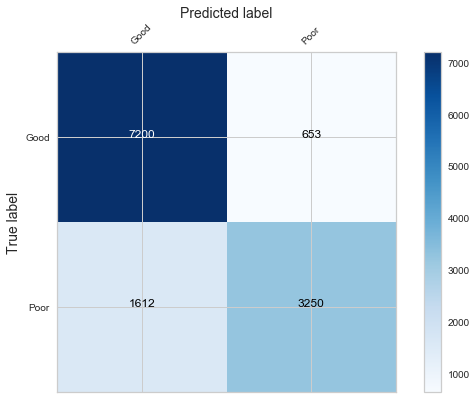

In [115]:
matrix = confusion_matrix(y_test,y_pred)

plt.clf()

# place labels at the top
plt.gca().xaxis.tick_top()
plt.gca().xaxis.set_label_position('top')

# plot the matrix per se
plt.imshow(matrix, interpolation='nearest', cmap=plt.cm.Blues)

# plot colorbar to the right
plt.colorbar()

fmt = 'd'

# write the number of predictions in each bucket
thresh = matrix.max() / 2.
for i, j in itertools.product(range(matrix.shape[0]), range(matrix.shape[1])):

    # if background is dark, use a white number, and vice-versa
    plt.text(j, i, format(matrix[i, j], fmt),
         horizontalalignment="center",
         color="white" if matrix[i, j] > thresh else "black")

tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=45)
plt.yticks(tick_marks, class_names)
plt.tight_layout()
plt.ylabel('True label',size=14)
plt.xlabel('Predicted label',size=14)
plt.show()

In [116]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, random_state=123)
xg2 = xgb.XGBClassifier(objective ='reg:linear', colsample_bytree = 0.3, learning_rate = 0.1,
                max_depth = 5, alpha = 10, n_estimators = 10)
xg2.fit(X_train,y_train)

preds = xg1.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, preds))
print("RMSE: %f" % (rmse))
y_pred = xg2.predict(X_test)

RMSE: 0.406984


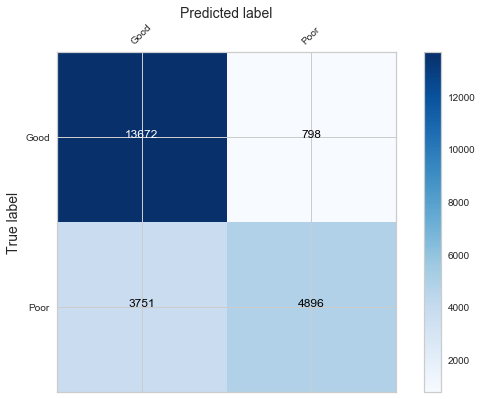

In [118]:
matrix = confusion_matrix(y_test,y_pred)

plt.clf()

# place labels at the top
plt.gca().xaxis.tick_top()
plt.gca().xaxis.set_label_position('top')

# plot the matrix per se
plt.imshow(matrix, interpolation='nearest', cmap=plt.cm.Blues)

# plot colorbar to the right
plt.colorbar()

fmt = 'd'

# write the number of predictions in each bucket
thresh = matrix.max() / 2.
for i, j in itertools.product(range(matrix.shape[0]), range(matrix.shape[1])):

    # if background is dark, use a white number, and vice-versa
    plt.text(j, i, format(matrix[i, j], fmt),
         horizontalalignment="center",
         color="white" if matrix[i, j] > thresh else "black")

tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=45)
plt.yticks(tick_marks, class_names)
plt.tight_layout()
plt.ylabel('True label',size=14)
plt.xlabel('Predicted label',size=14)
plt.show()

In [288]:
fpr, tpr, _ = roc_curve(X, y_pred)
roc_auc = auc(fpr, tpr)
#xgb.plot_importance(gbm)
#plt.show()
plt.figure()
lw = 2
plt.plot(fpr, tpr, color='darkorange',
lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([-0.02, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve')
plt.legend(loc="lower right")
plt.show()

ValueError: continuous-multioutput format is not supported

In [290]:
!pip install dataiku

  Could not find a version that satisfies the requirement dataiku (from versions: )
No matching distribution found for dataiku


In [296]:
#Fine Tuning using GridSearch
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
from datetime import datetime
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import StratifiedKFold
from xgboost import XGBClassifier
# A parameter grid for XGBoost

params = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5]
        }
xgb = XGBClassifier(learning_rate=0.02, n_estimators=600, objective='binary:logistic',
                    silent=True, nthread=1)
folds = 3
param_comb = 5

skf = StratifiedKFold(n_splits=folds, shuffle = True, random_state = 1001)

random_search = RandomizedSearchCV(xgb, param_distributions=params, n_iter=param_comb, scoring='roc_auc', n_jobs=4, cv=skf.split(X,y), verbose=3, random_state=1001 )

# Here we go
start_time = timer(None) # timing starts from this point for "start_time" variable
random_search.fit(X, y)
timer(start_time) # timing ends here for "start_time" variable

Fitting 3 folds for each of 5 candidates, totalling 15 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  15 out of  15 | elapsed:  3.5min finished



 Time taken: 0 hours 4 minutes and 19.56 seconds.


In [297]:
print('\n All results:')
print(random_search.cv_results_)
print('\n Best estimator:')
print(random_search.best_estimator_)
print('\n Best normalized gini score for %d-fold search with %d parameter combinations:' % (folds, param_comb))
print(random_search.best_score_ * 2 - 1)
print('\n Best hyperparameters:')
print(random_search.best_params_)
results = pd.DataFrame(random_search.cv_results_)
results.to_csv('xgb-random-grid-search-results-01.csv', index=False)


 All results:
{'std_train_score': array([0.00124141, 0.00115708, 0.00102582, 0.00147125, 0.00129928]), 'rank_test_score': array([5, 1, 2, 3, 4]), 'mean_train_score': array([0.90274931, 0.9369735 , 0.9339106 , 0.92834133, 0.92100301]), 'param_max_depth': masked_array(data=[3, 5, 5, 5, 4],
             mask=[False, False, False, False, False],
       fill_value='?',
            dtype=object), 'std_test_score': array([0.00174283, 0.00179517, 0.00198421, 0.00173578, 0.00201022]), 'split0_train_score': array([0.90201257, 0.93555253, 0.93282652, 0.92686392, 0.91945688]), 'param_colsample_bytree': masked_array(data=[1.0, 0.8, 0.8, 0.6, 1.0],
             mask=[False, False, False, False, False],
       fill_value='?',
            dtype=object), 'param_gamma': masked_array(data=[5, 1.5, 1, 5, 1],
             mask=[False, False, False, False, False],
       fill_value='?',
            dtype=object), 'split1_train_score': array([0.90449774, 0.93838676, 0.93528752, 0.93034882, 0.9226359 ]), 'pa